In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from pandas_profiling import ProfileReport
import matplotlib.patches as mpatches

# for DB work
from sqlalchemy import create_engine
from pandas.io import sql

In [2]:
# inserting data into database
# this will overwrite the database though,
# so if you want to merge data, a different operation
# or table might be the better play
# if exists also has "append"

hostname=''
dbname=''
uname=''
pwd=''

engine = create_engine("mysql+pymysql://{user}:{pw}@{host}/{db}".format(host=hostname, db=dbname, user=uname, pw=pwd))

In [3]:
# df_b = pd.read_sql('SELECT * FROM users', con=engine)
# df_b1 = pd.read_sql('SELECT * FROM test', con=engine)
# df_b2 = pd.read_sql('SELECT * FROM table_A', con=engine)
# df_b3 = pd.read_sql('SELECT * FROM table_B', con=engine)

# frames=[df_b,df_b1,df_b2,df_b3]
# fdb=pd.concat(frames)
# len(fdb)

In [4]:
top100 = pd.read_csv('./data/top100.csv')
fdb = pd.read_csv('./data/final_Table.csv')

In [5]:
# top100 = pd.read_sql('SELECT * FROM top100', con=engine)

In [6]:
# We had combined all the data table that were named users, test, table_A and table_B 
#into one called, final_Table.
# fdb = pd.read_sql('SELECT * FROM final_Table', con=engine)

In [7]:
fdb

,ids,name,album,artist,release_date,length,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,keys,valence
0,2LKBDF6u2QNrzlUPzvpNAS,Tellin' Me Lies,Nature Of The Beast,April Wine,1981,3.025550,23,0.706,0.054300,0.637,0.000046,0.0616,-11.825,0.0340,137.752,3.0,9,0.9650
1,2Y0HDXWfE6KifNzo3GEScQ,Dancer,Hot Space,Queen,1982-05-03,3.818883,25,0.745,0.043500,0.336,0.000009,0.0766,-11.970,0.0398,100.093,4.0,9,0.6250
2,2lRETJsdBygk2oVWbPpSRV,In Your Eyes,Emotions In Motion,Billy Squier,1982,3.777333,25,0.526,0.220000,0.558,0.000000,0.0589,-6.918,0.0291,137.122,4.0,2,0.5660
3,12KemAQUoawzL08yLuwrtx,The Christmas Song,An Old Time Christmas,Randy Travis,1989-08-14,3.281767,15,0.555,0.651000,0.178,0.007280,0.0939,-17.262,0.0319,134.625,4.0,1,0.0986
4,5lxl6lhnrMFUo4vTqA7xB6,The Deeper the Love - 2009 Remaster,Slip of the Tongue (20th Anniversary Edition),Whitesnake,1989,4.341100,29,0.558,0.000931,0.701,0.000003,0.0928,-6.421,0.0267,103.628,4.0,9,0.5590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343870,4u6MkYSUUFHeqUTireciEG,"One Love, One Life, One Girl",The Wildhearts Must Be Destroyed,The Wildhearts,2003-08-25,0.252888,13,0.588,0.000556,0.494,0.134000,0.1140,-6.584,0.0300,138.647,4.0,11,0.4520
343871,3jTO7utKw3EOTQ7ULDmMEy,I Melt with You,Cover Ups,Good Riddance,2002-07-02,0.237600,13,0.514,0.000206,0.953,0.001450,0.1020,-5.010,0.0559,105.954,4.0,5,0.9070
343872,2CYpge0JjGriydFIPzN4an,Stumble And Fall,State Of Flow,No Fun At All,2000-05-08,0.399488,15,0.493,0.001570,0.922,0.000209,0.2910,-4.462,0.0319,171.070,4.0,1,0.7870
343873,3pAmeg1aiCU2PHLgc5CJE2,My Extraordinary Mind,State Of Flow,No Fun At All,2000-05-08,0.261710,10,0.490,0.000392,0.989,0.000001,0.1320,-4.753,0.0443,98.563,4.0,1,0.6560


<hr>

# Little Cleaning

### Empty or special characters used for names, album and artist are replaced with NaN and then dropped


In [7]:
fdb['name'].replace('', np.nan,inplace=True)
fdb['name'].replace('!', np.nan,inplace=True)

fdb.dropna(inplace=True)

In [8]:
fdb.reset_index(drop=True,inplace=True)
len(fdb)

343011

<hr>

Some songs are written in minutes but divided by 10

So, a song thats 2:30 mins long, is showing :230, so we only run the bottom 2 cells, if the data wasn't already in minutes.

In [9]:
def leng(x):
    if x <= .09:
        return x*100
    if x>.09 and x<1.00:
        return x*10
    if x >= 1.00:
        return x

In [10]:
fdb['length']=fdb['length'].apply(lambda x: leng(x))

In [11]:
#setting minutes to only 2 decimal places.
fdb['length'] = fdb['length'].round(2)

### Final Count and Data

In [12]:
print("So, we still have",format(((343011/343875)*100),".2f"),
      "percent of track ids that are totally valid and has updated data information from Spotify API")

So, we still have 99.75 percent of track ids that are totally valid and has updated data information from Spotify API


<hr>

# Making changes to columns
Let's break down ```release_date``` into years, months, and dates. 

In [13]:
def month(x):
    date_length=len(str(x))
    mo=0
    if date_length == 10:
        mo=x[5:7]
        return int(mo)
    else:
        return int(mo)

In [14]:
def date(x):
    date_length=len(str(x))
    da=0
    if date_length == 10:
        da=x[8:]
        return int(da)
    else:
        return int(da)

In [15]:
# break down the dates so its easier to analyze
#get year
fdb['release_Year'] = pd.DatetimeIndex(fdb['release_date']).year 

#get month
fdb['release_Month']=fdb['release_date'].apply(lambda x: month(x))

#get date
fdb['release_Date']=fdb['release_date'].apply(lambda x: date(x))

fdb.drop(['release_date'], axis=1,inplace=True)


<hr>

# New DataFrame
The new dataframe now contains ```release_Year```, ```release_Month```, and ```release_Date```. We dropped ```release_date```. 

In [16]:
fdb

,ids,name,album,artist,length,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,keys,valence,release_Year,release_Month,release_Date
0,2LKBDF6u2QNrzlUPzvpNAS,Tellin' Me Lies,Nature Of The Beast,April Wine,3.03,23,0.706,0.054300,0.637,0.000046,0.0616,-11.825,0.0340,137.752,3.0,9,0.9650,1981,0,0
1,2Y0HDXWfE6KifNzo3GEScQ,Dancer,Hot Space,Queen,3.82,25,0.745,0.043500,0.336,0.000009,0.0766,-11.970,0.0398,100.093,4.0,9,0.6250,1982,5,3
2,2lRETJsdBygk2oVWbPpSRV,In Your Eyes,Emotions In Motion,Billy Squier,3.78,25,0.526,0.220000,0.558,0.000000,0.0589,-6.918,0.0291,137.122,4.0,2,0.5660,1982,0,0
3,12KemAQUoawzL08yLuwrtx,The Christmas Song,An Old Time Christmas,Randy Travis,3.28,15,0.555,0.651000,0.178,0.007280,0.0939,-17.262,0.0319,134.625,4.0,1,0.0986,1989,8,14
4,5lxl6lhnrMFUo4vTqA7xB6,The Deeper the Love - 2009 Remaster,Slip of the Tongue (20th Anniversary Edition),Whitesnake,4.34,29,0.558,0.000931,0.701,0.000003,0.0928,-6.421,0.0267,103.628,4.0,9,0.5590,1989,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343006,4u6MkYSUUFHeqUTireciEG,"One Love, One Life, One Girl",The Wildhearts Must Be Destroyed,The Wildhearts,2.53,13,0.588,0.000556,0.494,0.134000,0.1140,-6.584,0.0300,138.647,4.0,11,0.4520,2003,8,25
343007,3jTO7utKw3EOTQ7ULDmMEy,I Melt with You,Cover Ups,Good Riddance,2.38,13,0.514,0.000206,0.953,0.001450,0.1020,-5.010,0.0559,105.954,4.0,5,0.9070,2002,7,2
343008,2CYpge0JjGriydFIPzN4an,Stumble And Fall,State Of Flow,No Fun At All,3.99,15,0.493,0.001570,0.922,0.000209,0.2910,-4.462,0.0319,171.070,4.0,1,0.7870,2000,5,8
343009,3pAmeg1aiCU2PHLgc5CJE2,My Extraordinary Mind,State Of Flow,No Fun At All,2.62,10,0.490,0.000392,0.989,0.000001,0.1320,-4.753,0.0443,98.563,4.0,1,0.6560,2000,5,8


In [17]:
# For ProfileReport
design_report = ProfileReport(fdb)
design_report

<hr>

# Featuring
We have approximately 340K, there has to be songs that has featuring artists but we don't see their name under aritst. Artist column only carries the orginial artist name or Various Artists but not the featuring artist's name. So, we'll create new column for featuring artist which are mentioned usually in the name of Song. Let's put them in and if a song doesn't have featuring artist, we'll fill in none.

In [18]:
def feat(x):
    spl_word='feat.'
    res = x.partition(spl_word)[2] 
    d=x.partition(spl_word)[2]
    d=d.strip()
    try:
        if d[-1] == ')' or d[-1] == ']':
            return d[:-1]
        else:
            return d
    except:
        return d

In [19]:
fdb['featuring']=fdb['name'].apply(lambda x: feat(x))

In [20]:
# if there is no featuring artist, 
# it'll be empty, so we're filling with none.
fdb.replace(r'^\s*$', 'none', regex=True,inplace=True)

In [21]:
df=fdb[fdb['featuring']!='none']

### Table with ```featuring``` artist

In [22]:
df

,ids,name,album,artist,length,popularity,danceability,acousticness,energy,instrumentalness,...,loudness,speechiness,tempo,time_signature,keys,valence,release_Year,release_Month,release_Date,featuring
46,580qfiaOR7n9PuKbRUi7qx,Friendly Skies (feat. Ginuwine),Supa Dupa Fly,Missy Elliott,5.00,39,0.750,0.31900,0.291,0.000054,...,-12.196,0.0914,108.325,3.0,9,0.4970,1997,7,11,Ginuwine
48,5cxQSKOme3MaAtdF3JEWln,They Don't Dance No Mo' (feat. Lil' Will),Still Standing,Goodie Mob,3.43,36,0.798,0.01340,0.668,0.000000,...,-8.648,0.2220,156.031,4.0,5,0.3250,1998,4,7,Lil' Will
95,5vagrguhKusDNKj179pu8R,The Closer I Get to You (feat. Beyoncé Knowles),Dangerously In Love,Beyoncé,4.96,49,0.652,0.61900,0.292,0.000000,...,-9.603,0.0467,116.109,4.0,0,0.3040,2003,6,24,Beyoncé Knowles
101,79jaa2QGadIViTda6v5Q31,"Never Scared (feat. Cam'ron, Jadakiss & Busta ...",AttenCHUN!,Bone Crusher,5.33,46,0.627,0.00511,0.889,0.001000,...,-3.485,0.0664,73.012,4.0,11,0.4910,2003,4,29,"Cam'ron, Jadakiss & Busta Rhymes) - The Takeov..."
310,0jG92AlXau21qgCQRxGLic,One Minute Man (feat. Ludacris),Miss E... So Addictive,Missy Elliott,4.22,56,0.622,0.02660,0.669,0.000003,...,-8.419,0.3290,93.839,4.0,9,0.5700,2001,5,14,Ludacris
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342378,6JxDjkJGIfGhopBm1r0J7y,Wish (feat. Trippie Redd),Wish (feat. Trippie Redd),Diplo,2.92,0,0.570,0.07480,0.903,0.000000,...,-4.835,0.0905,93.943,4.0,9,0.6030,2018,3,22,Trippie Redd
342385,4iDCuTlmGNbpuUILTsJ9vf,Jesse Owens (feat. NAV),Jesse Owens (feat. NAV),Rowdy Rebel,3.10,68,0.821,0.06530,0.745,0.000000,...,-4.844,0.2860,142.023,4.0,10,0.4320,2021,2,12,NAV
342391,1ZEm9cJC05rawV2tptNfTS,Bed (feat. Ariana Grande),Bed (feat. Ariana Grande),Nicki Minaj,3.16,1,0.589,0.05510,0.714,0.000130,...,-6.308,0.2580,118.611,5.0,7,0.4200,2018,6,14,Ariana Grande
342393,2KG4X41ARZad7B6XczCvgc,Chains Choking Me (feat. Gunna),Slime Language,Young Thug,3.02,43,0.722,0.01230,0.482,0.000000,...,-11.249,0.3250,81.735,4.0,2,0.0842,2018,8,17,Gunna


### Table with ```featuring``` artist column AND ```artist``` column which has value of 'Various Artists'

In [23]:
df[df['artist']=='Various Artists']

,ids,name,album,artist,length,popularity,danceability,acousticness,energy,instrumentalness,...,loudness,speechiness,tempo,time_signature,keys,valence,release_Year,release_Month,release_Date,featuring
873,7HLc5rBqNj3MK4vTnW2goQ,House of Prayer (feat. Paula Malone),New Song: Original Hits from 15 Years of the P...,Various Artists,5.43,1,0.171,0.975000,0.181,0.007750,...,-14.841,0.0398,83.128,4.0,10,0.0604,2013,4,23,Paula Malone
875,2nPYljsS48jYzPlZg9neI5,Freedom (feat. Jennifer Trebels & Ryan Malone),New Song: Original Hits from 15 Years of the P...,Various Artists,5.40,1,0.132,0.966000,0.269,0.003900,...,-13.517,0.0384,53.193,4.0,2,0.1350,2013,4,23,Jennifer Trebels & Ryan Malone
1304,4PrquuUN34hswtM71OMvxS,Get Up (feat. Chamillionaire),Step Up Soundtrack,Various Artists,4.39,57,0.941,0.036600,0.631,0.000002,...,-5.998,0.1140,128.597,4.0,1,0.6300,2006,8,8,Chamillionaire
1897,71mDjdeVK9sqXmamMHaAfX,Some Cut (feat. Cutty),The Crunk Recordings: Hits From The Pioneers A...,Various Artists,4.72,52,0.901,0.002730,0.512,0.000000,...,-6.468,0.3700,85.012,4.0,1,0.6380,2009,8,21,Cutty
1942,25EVfWfKOTsB0hCNiUgC7A,So Free (feat. Paula Abdul),Cascine: The First Five Years (Mix Curated by ...,Various Artists,3.70,1,0.641,0.505000,0.882,0.520000,...,-6.612,0.0434,118.986,4.0,4,0.5630,2015,8,11,Paula Abdul
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330052,48tybOd2kxWaMjnYrEWTvY,Tupac Back (feat. Rick Ross),"MMG Presents: Self Made, Vol. 1",Various Artists,3.95,41,0.675,0.047100,0.673,0.000000,...,-4.033,0.3580,140.036,4.0,1,0.6370,2011,5,23,Rick Ross
333503,0WiinGQuziMvTRpYFWIS5U,Show Up! (feat. John P. Kee),Gotta Have Gospel! Ultimate Choirs,Various Artists,5.08,13,0.667,0.154000,0.969,0.000000,...,-4.964,0.0531,106.995,4.0,11,0.7960,2010,7,23,John P. Kee
333940,0mYNxaedZsptTWmaqy2PoB,Big Spender (feat. Prince Charlez),Fifty Shades Freed (Original Motion Picture So...,Various Artists,3.25,56,0.587,0.128000,0.739,0.000386,...,-5.410,0.2540,78.796,4.0,1,0.8650,2018,2,9,Prince Charlez
337330,3tpdgwu5siEfNfaJqn8vVf,Till Tonight (Chris Kaeser Remix) [feat. Jonat...,"Strange Clubbers, Vol.02",Various Artists,5.66,0,0.821,0.000071,0.752,0.176000,...,-6.756,0.0753,128.002,4.0,2,0.1610,2010,7,31,Jonathan Mendelsohn


### Observation
We notice that table with just ```featuring``` artist column has **10513** rows (table_A) compare to Table with ```featuring``` artist column AND ```artist``` column which has value of 'Various Artists' which returns only **323** rows (table_B).

We beleive that **10190** artist weren't given proper credits by spotify under the artist column. Only **323** were given credits properly since, since artist column for them had 'Various Artists' which would let a user know that more than one person worked on this track. Yes, the featuring artist is given credit in song title, but if a user or developer were to only extract album and aritst of a song, they won't know that the song created with the help of multiple artist.
<hr>

### Rearrange the columns

In [24]:
fdb=fdb[['ids','name','album','artist','featuring','release_Year','release_Month','release_Date','length','popularity','danceability','acousticness','energy','instrumentalness','liveness','loudness','speechiness','tempo','keys','time_signature','valence']]
fdb

,ids,name,album,artist,featuring,release_Year,release_Month,release_Date,length,popularity,...,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,keys,time_signature,valence
0,2LKBDF6u2QNrzlUPzvpNAS,Tellin' Me Lies,Nature Of The Beast,April Wine,none,1981,0,0,3.03,23,...,0.054300,0.637,0.000046,0.0616,-11.825,0.0340,137.752,9,3.0,0.9650
1,2Y0HDXWfE6KifNzo3GEScQ,Dancer,Hot Space,Queen,none,1982,5,3,3.82,25,...,0.043500,0.336,0.000009,0.0766,-11.970,0.0398,100.093,9,4.0,0.6250
2,2lRETJsdBygk2oVWbPpSRV,In Your Eyes,Emotions In Motion,Billy Squier,none,1982,0,0,3.78,25,...,0.220000,0.558,0.000000,0.0589,-6.918,0.0291,137.122,2,4.0,0.5660
3,12KemAQUoawzL08yLuwrtx,The Christmas Song,An Old Time Christmas,Randy Travis,none,1989,8,14,3.28,15,...,0.651000,0.178,0.007280,0.0939,-17.262,0.0319,134.625,1,4.0,0.0986
4,5lxl6lhnrMFUo4vTqA7xB6,The Deeper the Love - 2009 Remaster,Slip of the Tongue (20th Anniversary Edition),Whitesnake,none,1989,0,0,4.34,29,...,0.000931,0.701,0.000003,0.0928,-6.421,0.0267,103.628,9,4.0,0.5590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343006,4u6MkYSUUFHeqUTireciEG,"One Love, One Life, One Girl",The Wildhearts Must Be Destroyed,The Wildhearts,none,2003,8,25,2.53,13,...,0.000556,0.494,0.134000,0.1140,-6.584,0.0300,138.647,11,4.0,0.4520
343007,3jTO7utKw3EOTQ7ULDmMEy,I Melt with You,Cover Ups,Good Riddance,none,2002,7,2,2.38,13,...,0.000206,0.953,0.001450,0.1020,-5.010,0.0559,105.954,5,4.0,0.9070
343008,2CYpge0JjGriydFIPzN4an,Stumble And Fall,State Of Flow,No Fun At All,none,2000,5,8,3.99,15,...,0.001570,0.922,0.000209,0.2910,-4.462,0.0319,171.070,1,4.0,0.7870
343009,3pAmeg1aiCU2PHLgc5CJE2,My Extraordinary Mind,State Of Flow,No Fun At All,none,2000,5,8,2.62,10,...,0.000392,0.989,0.000001,0.1320,-4.753,0.0443,98.563,1,4.0,0.6560


### How long will it take someone to listen to this list of tracks?

In [25]:
print("It'll take \n", 
      format(fdb.length.sum()/(525600),".2f"),"years or\n", 
      format(fdb.length.sum()/(43800),".2f"), "months or\n",
      format(fdb.length.sum()/(1440),".2f"), "days or\n",
      format(fdb.length.sum()/(60),".2f"), "hours to listen to this list of songs.")

It'll take 
 2.43 years or
 29.20 months or
 888.32 days or
 21319.61 hours to listen to this list of songs.


<hr>

In [26]:
fdb[['length','popularity','danceability','acousticness','energy','instrumentalness','liveness','loudness','speechiness','tempo','keys','valence']].describe()

,length,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,keys,valence
count,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000,343011.000000
mean,3.729259,23.747270,0.562097,0.369416,0.571370,0.191944,0.208790,-9.917402,0.101729,120.486374,5.261306,0.504746
std,1.397568,20.892877,0.173158,0.364965,0.271115,0.331249,0.177093,5.496359,0.148138,30.133202,3.550062,0.258825
min,0.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,2.870000,1.000000,0.447000,0.026700,0.353000,0.000000,0.097900,-12.768000,0.036000,96.567000,2.000000,0.294000
50%,3.500000,22.000000,0.571000,0.223000,0.594000,0.000350,0.136000,-8.670000,0.048900,120.015000,5.000000,0.509000
75%,4.310000,40.000000,0.690000,0.732000,0.806000,0.220000,0.273000,-5.854500,0.091300,140.113500,8.000000,0.715000
max,9.990000,100.000000,0.988000,0.996000,1.000000,1.000000,1.000000,3.855000,0.971000,244.835000,11.000000,1.000000


<hr>

# Which year has the highest and lowest amount of songs?

In [27]:
db = fdb.groupby('release_Year')['release_Month'].count().nsmallest()
db1 = fdb.groupby('release_Year')['release_Month'].count().nlargest()
print(db,'\n\n',db1)

release_Year
1905      2
1900     13
1922    121
1921    156
1923    185
Name: release_Month, dtype: int64 

 release_Year
2020    21626
2019    18996
2018    16753
2017    15546
2016    13673
Name: release_Month, dtype: int64


We notice that ```2020 year```list will take the most time, and ```1905 year``` list will take the least time to listen all of that respective years songs.
<hr>

# Top 10 Artist

In [28]:
fdb['artist'].value_counts().nlargest(11)

Various Artists             27546
Grateful Dead                3478
Francisco Canaro             2228
Tadeusz Dolega Mostowicz     1281
Эрнест Хемингуэй             1175
Эрих Мария Ремарк            1062
Armin van Buuren              995
The Beatles                   938
Wolfgang Amadeus Mozart       907
King Tubby                    888
Frank Sinatra                 850
Name: artist, dtype: int64

The Top artist was **Various Artists** so we'll print top 11, where we'll consider no. 2 to be the top artist, who in this case is Grateful Dead. An american rock band group.
<hr>

# Data Normalizing
The data is allover the place. Popularity data is between 0 and 100, keys data is between 0 and 11 and energy data is between 0 and 1

In [29]:
z=fdb[['popularity','danceability','acousticness','energy',
       'instrumentalness','liveness','loudness','speechiness',
       'tempo','keys','valence']]
normalized = preprocessing.normalize(z)
normal_df = pd.DataFrame(normalized,
                       columns=['popularity','danceability','acousticness','energy',
                                'instrumentalness','liveness','loudness','speechiness',
                                'tempo','keys','valence'])
normal_df

,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,keys,valence
0,0.163755,0.005027,3.866038e-04,0.004535,3.260857e-07,0.000439,-0.084191,0.000242,0.980763,0.064078,0.006871
1,0.239798,0.007146,4.172490e-04,0.003223,8.584778e-08,0.000735,-0.114815,0.000382,0.960085,0.086327,0.005995
2,0.179119,0.003769,1.576251e-03,0.003998,0.000000e+00,0.000422,-0.049566,0.000208,0.982448,0.014330,0.004055
3,0.109842,0.004064,4.767133e-03,0.001303,5.330988e-05,0.000688,-0.126406,0.000234,0.985830,0.007323,0.000722
4,0.268069,0.005158,8.605952e-06,0.006480,2.338674e-08,0.000858,-0.059354,0.000247,0.957914,0.083194,0.005167
...,...,...,...,...,...,...,...,...,...,...,...
343006,0.092959,0.004205,3.975775e-06,0.003532,9.581905e-04,0.000815,-0.047080,0.000215,0.991420,0.078657,0.003232
343007,0.121504,0.004804,1.925372e-06,0.008907,1.355237e-05,0.000953,-0.046826,0.000522,0.990295,0.046732,0.008477
343008,0.087315,0.002870,9.138934e-06,0.005367,1.216584e-06,0.001694,-0.025973,0.000186,0.995795,0.005821,0.004581
343009,0.100810,0.004940,3.951757e-06,0.009970,1.320613e-08,0.001331,-0.047915,0.000447,0.993615,0.010081,0.006613


That looks much better and is much easier to analyze and graph.
<hr>

# Visualization

# #1 Mean and Median of Keys  

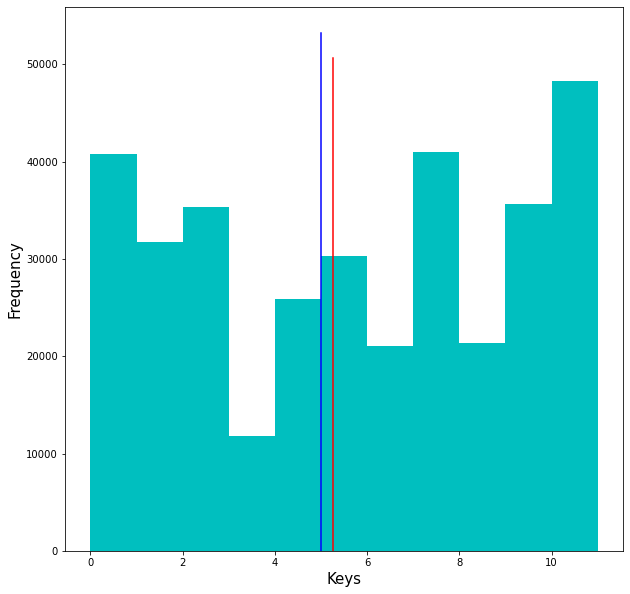

Mean --  5.26130648871319 
and 
Median --  5.0


In [30]:
fig=plt.figure(figsize=(10,10))
fig=plt.hist(fdb['keys'],bins=11,color='c')
mean=np.mean(fdb['keys'])
median=np.median(fdb['keys'])
axes = plt.gca()
plt.plot([mean, mean], axes.get_ylim(), color = 'red')
plt.plot([median, median], axes.get_ylim(), color = 'blue')
plt.ylabel('Frequency', fontsize = 15)
plt.xlabel('Keys', fontsize = 15)
plt.show()
print('Mean -- ',mean,'\nand \nMedian -- ',median)


We used ```fdb``` as our data source for above graph beacause it's easier to see the singular keys ranging from 0 to 11, rather than in decimals from the ```normal_df``` which can be confusing when graphed beacuse we wont know exactly which key represent which number.

We see that **Mean** is 5.26 and **Median** is 5.0.
<hr>

# #2 Correlation heatmap between all features of a song.

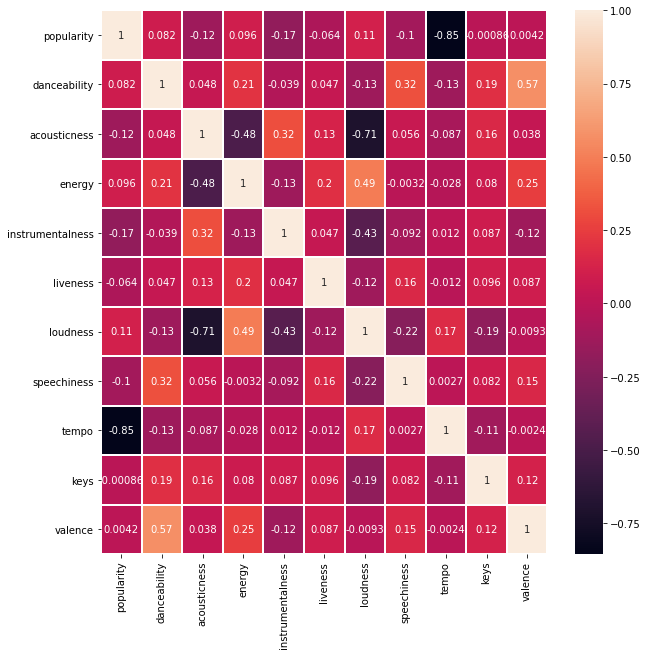

In [31]:
plt.figure(figsize=(10,10))
sns.heatmap(normal_df.corr(),linecolor='white',linewidths=1,annot=True)
plt.show()

<hr>

# #3 Energy vs. Speechiness

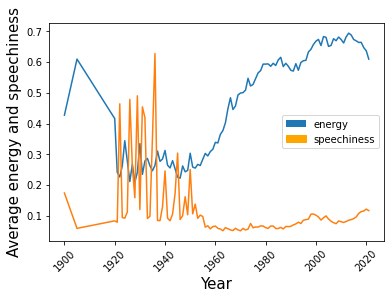

In [32]:
y=(fdb.groupby('release_Year')['energy'].mean())
y1=(fdb.groupby('release_Year')['speechiness'].mean())
x=sorted(fdb['release_Year'].unique())

plt.plot(x,y,x,y1)
plt.xlabel('Year',size=15)
plt.ylabel('Average energy and speechiness',size=15)
plt.xticks(rotation = 45)
r = mpatches.Patch(label='energy')
b = mpatches.Patch(color='orange', label='speechiness')
plt.legend(handles=[r,b])

plt.show()

### Observation 
We see that between 1920's and 1960's the average of speechiness in song increased heavily while average of energy in song was hittin all time low, which could be because of great depression which was from 1920's to 1930's and **World War 2** which was from 1939 to 1945. But after mid 1940's the music started getting more energetic which could be because the allies winning the **World War 2**. We see another significant spike around 1990's which is when **Cold War** was ended.
<hr>

# #4. Popularity vs. Average of keys

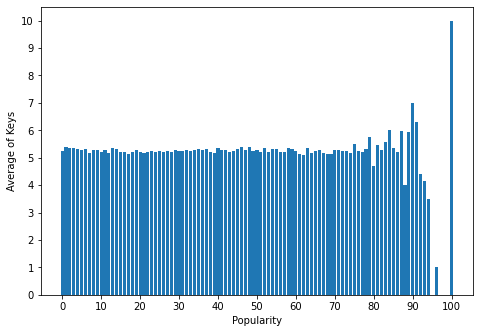

In [33]:
y=(fdb.groupby('popularity')['keys'].mean())
x=sorted(fdb['popularity'].unique())

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.set_ylabel('Average of Keys')
ax.set_xlabel('Popularity')
ax.set_yticks(np.arange(0, 12, 1))
ax.set_xticks(np.arange(0, 110, 10))
ax.bar(x,y)
plt.show()


<hr>

# #5. Decades
Mean values of each **Tracks's** danceability, energy, valence, acousticness, instrumentalness, and liveness.

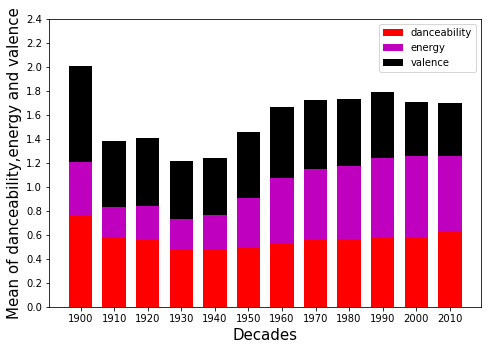

In [34]:
x=fdb.groupby((fdb.release_Year//10)*10)['danceability'].mean()
y=fdb.groupby((fdb.release_Year//10)*10)['energy'].mean()
z=fdb.groupby((fdb.release_Year//10)*10)['valence'].mean()

ind = (np.arange(1900,2020,10))
width = 7
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

ax.bar(ind, x, width, color='r')
ax.bar(ind, y, width,bottom=x, color='m')
ax.bar(ind, z, width,bottom=x+y, color='k')

ax.set_ylabel('Mean of danceability,energy and valence',size=15)
ax.set_xlabel('Decades',size=15)


ax.set_yticks(np.arange(0, 2.5, .20))
ax.set_xticks(np.arange(1900, 2020,10))
ax.legend(labels=['danceability', 'energy','valence'])
plt.show()

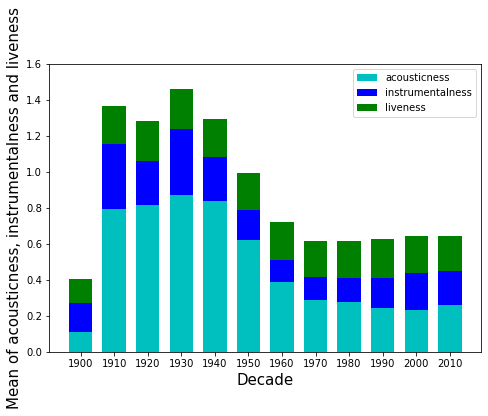

In [35]:
w=fdb.groupby((fdb.release_Year//10)*10)['acousticness'].mean()
x=fdb.groupby((fdb.release_Year//10)*10)['instrumentalness'].mean()
y=fdb.groupby((fdb.release_Year//10)*10)['liveness'].mean()

ind = (np.arange(1900,2020,10))
width = 7
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

ax.bar(ind, w, width, color='c')
ax.bar(ind, x, width,bottom=w, color='b')
ax.bar(ind, y, width,bottom=x+w, color='g')

ax.set_ylabel('Mean of acousticness, instrumentalness and liveness',size=15)
ax.set_xlabel('Decade',size=15)


ax.set_yticks(np.arange(0, 1.80, .20))
ax.set_xticks(np.arange(1900, 2020,10))
ax.legend(labels=['acousticness', 'instrumentalness','liveness'])
plt.show()

# #8. Differentiating between English named songs and non English named Songs

In [36]:
## This function is returning a boolean value for each song's title.
## True if it's an engligh title,
## False if it's non english.

def isEnglish(s):
    try:
        s.encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        return False
    else:
        return True

In [37]:
## Determining English and non English songs in the top100 dataframe

# Here we are building twodifferent dataframes, 
# one with English named songs,
# one with non english named songs

Columns=top100.columns

Englishtop100=pd.DataFrame(columns=Columns)

NonEnglishtop100=pd.DataFrame(columns=Columns)

for name in top100["title"]:
    if isEnglish(name)==True:
        row1 = top100.loc[top100["title"]==name]
        Englishtop100=Englishtop100.append(row1,ignore_index=True)
    elif isEnglish(name)==False:
        row2 = top100.loc[top100["title"]==name]
        NonEnglishtop100=NonEnglishtop100.append(row2,ignore_index=True)

In [38]:
display(Englishtop100.head(5))

,year,rank,artist,title,album,release_date,length,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,keys,valence,ids
0,1990,1,Wilson Phillips,Hold On,Wilson Phillips,1990-01-01,266866,68,0.679,0.4000,0.657,0.000000,0.0497,-9.897,0.0255,97.800,4.0,5.0,0.546,4VZDv8sASBS8UruUBGTFdk
1,1990,8,En Vogue,Hold On,Vessel,2013-01-08,263733,66,0.608,0.2410,0.776,0.000000,0.0713,-3.635,0.0511,89.996,4.0,11.0,0.814,3C3cr2JQwXIhqAHqOardVO
2,1995,52,Jamie Walters,Hold On,One Song at a Time,2011-09-20,213440,48,0.750,0.5330,0.808,0.000000,0.0870,-4.074,0.0423,136.059,4.0,11.0,0.890,2t97pZAsSgraYlocMNhkSe
3,1990,2,Roxette,It Must Have Been Love,It Must Have Been Love,1990-05-20,258786,76,0.520,0.3400,0.652,0.000055,0.2560,-6.655,0.0274,80.609,4.0,5.0,0.722,6kvoHl80mfCVTv7XnZkjQn
4,1990,3,Sinéad O'Connor,Nothing Compares 2 U,I Do Not Want What I Haven't Got,1990-07-01,280040,72,0.511,0.0425,0.574,0.000023,0.1050,-7.016,0.0273,119.917,4.0,5.0,0.161,3nvuPQTw2zuFAVuLsC9IYQ


In [39]:
display(NonEnglishtop100.head(5))

,year,rank,artist,title,album,release_date,length,popularity,danceability,acousticness,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,keys,valence,ids
0,1999,71,Chanté Moore,Chanté's Got a Man,This Moment Is Mine,1999-01-01,264973,38,0.75,0.201,0.645,0.0,0.0582,-6.399,0.0576,111.569,4.0,1.0,0.506,6v4UCusR4LTRlM5WHBUyxQ


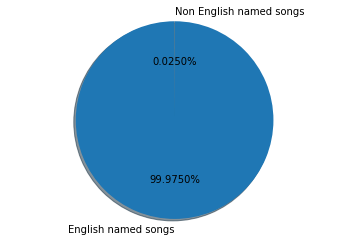

In [40]:
## top100 percentages

num_Englishtop100=Englishtop100.shape[0]
num_NonEnglishtop100=NonEnglishtop100.shape[0]

percentage_1=num_Englishtop100/(num_Englishtop100+num_NonEnglishtop100)
percentage_2=num_NonEnglishtop100/(num_Englishtop100+num_NonEnglishtop100)

# Pie chart for songs with english titles and non englis titles
labels = 'English named songs', 'Non English named songs'
sizes = [percentage_1, percentage_2]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%.4f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

# #8. Classifying songs based on their tempo 

In [41]:
## Based on the BPM of each song, 
## it is possible to build lists containing appropriate songs 
## for different activities, such as a light work out,
## running, studying and sleeping.

Working_out=[]
Running=[]
Studying=[]
Sleeping=[]

for index,song in fdb.iterrows():
    if 120<=song["tempo"]<=161:
        Working_out.append((song["name"]+"-"+song["artist"]))
    if 55<=song["tempo"]<=66: 
        Sleeping.append((song["name"]+"-"+song["artist"]))
    if 50<=song["tempo"]<=81: 
        Studying.append((song["name"]+"-"+song["artist"]))
    if 170<=song["tempo"]<=181:
        Running.append((song["name"]+"-"+song["artist"]))


activities_dictionary={"Running":len(Running),
                      "Sleeping":len(Sleeping),
                      "Studying":len(Studying),
                      "Working_out":len(Working_out)}

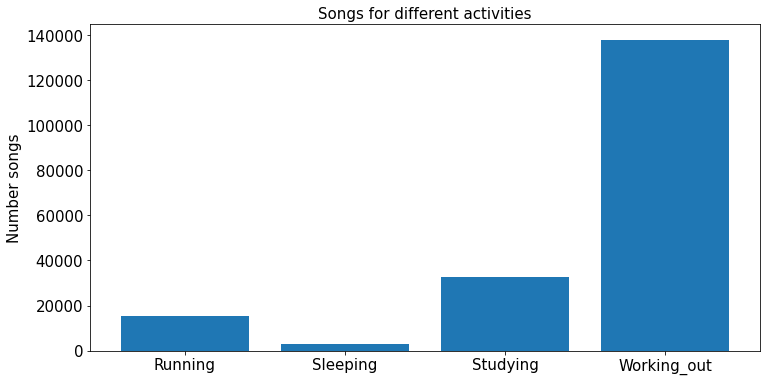

In [42]:
bar_fig = plt.figure(figsize = (12, 6))
    
_  = plt.bar(
    x = range(1, len(activities_dictionary) + 1),
    height = list(activities_dictionary.values()),
    tick_label = list(activities_dictionary.keys())
)


plt.tick_params(labelsize = 15)

_ = plt.title("Songs for different activities", fontsize = 15)

_ = plt.ylabel("Number songs", fontsize = 15)

# #9.Danceability per month 

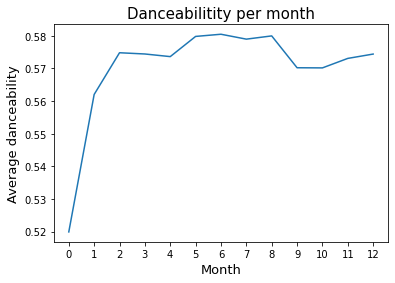

In [43]:
y=(fdb.groupby('release_Month')['danceability'].mean())

x=sorted(fdb['release_Month'].unique())

plt.plot(x,y)
plt.xlabel('Month',size=13)
plt.ylabel('Average danceability',size=13)
plt.xticks(range(0,13))
plt.title('Danceabilitity per month', size=15)

plt.show()



As we can see the danceability results higher in songs released  during summer, which is reasonable since summer songs usually have a "happier" rithm. After summer it goes slightly down to rise again in december, probably given by the release of christmas songs.

# #10.Danceability vs Loudness

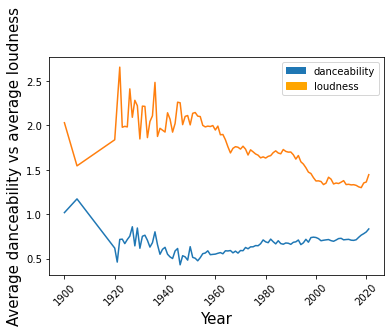

In [44]:
## Danceability vs Loudness

#normalizing data
fdb[['danceability']]=(fdb[['danceability']]-fdb[['danceability']].std())/fdb[['danceability']].mean()
fdb[['loudness']]=(fdb[['loudness']]-fdb[['loudness']].std())/fdb[['loudness']].mean()

##Plot

y=(fdb.groupby('release_Year')['danceability'].mean())
y1=(fdb.groupby('release_Year')['loudness'].mean())
x=sorted(fdb['release_Year'].unique())

plt.plot(x,y,x,y1)
plt.xlabel('Year',size=15)
plt.ylabel('Average danceability vs average loudness',size=15)
plt.xticks(rotation = 45)
r = mpatches.Patch(label='danceability')
b = mpatches.Patch(color='orange', label='loudness')
plt.legend(handles=[r,b])

plt.show()

# #11.Average Tempo, Danceability, Loudness, Liveness and Eneregy per month.

We'll compare Tempo vs month in the same way we compared danceability vs month, and we the result to be very similar since we can assume songs released in summer time have a higher BPM count.

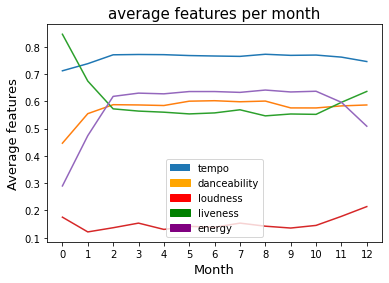

In [45]:
##standardizing features 
fdb[['danceability']]=(fdb[['danceability']]-fdb[['danceability']].std())/fdb[['danceability']].mean()
fdb[['loudness']]=(fdb[['loudness']]-fdb[['loudness']].std())/fdb[['loudness']].mean()
fdb[['tempo']]=(fdb[['tempo']]-fdb[['tempo']].std())/fdb[['tempo']].mean()
fdb[['liveness']]=(fdb[['liveness']]-fdb[['liveness']].std())/fdb[['liveness']].mean()
fdb[['energy']]=(fdb[['energy']]-fdb[['energy']].std())/fdb[['energy']].mean()



y=(fdb.groupby('release_Month')['tempo'].mean())
y1=(fdb.groupby('release_Month')['danceability'].mean())
y2=(fdb.groupby('release_Month')['loudness'].mean())
y3=(fdb.groupby('release_Month')['liveness'].mean())
y4=(fdb.groupby('release_Month')['energy'].mean())
x=sorted(fdb['release_Month'].unique())

plt.plot(x,y,x,y1,x,y2,x,y3,x,y4)
plt.xlabel('Month',size=13)
plt.ylabel('Average features',size=13)
plt.xticks(range(0,13))
plt.title('average features per month', size=15)
r = mpatches.Patch(label='tempo')
b = mpatches.Patch(color='orange', label='danceability')
c = mpatches.Patch(color='red', label='loudness')
d = mpatches.Patch(color='green', label='liveness')
e = mpatches.Patch(color='purple', label='energy')
plt.legend(handles=[r,b,c,d,e])
plt.show()

# #12.Years with the highest average popularity

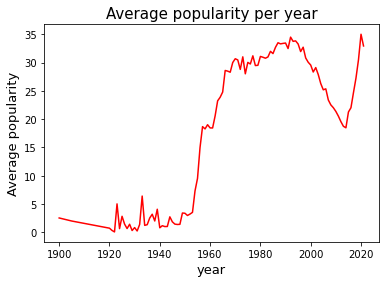

In [46]:
y=(fdb.groupby('release_Year')['popularity'].mean())

x=sorted(fdb['release_Year'].unique())

plt.plot(x,y, color='red')
plt.xlabel('year',size=13)
plt.ylabel('Average popularity',size=13)
plt.xticks()
plt.title('Average popularity per year', size=15)

plt.show()

# Top ten years with highest popularity

In [47]:
y=fdb.groupby('release_Year')['popularity'].mean().nlargest(10)
y

release_Year
2020    35.007953
1992    34.497421
1994    33.837545
1993    33.753190
1987    33.505059
1990    33.454722
1989    33.390600
1988    33.308558
1995    33.284338
2021    32.936939
Name: popularity, dtype: float64

<hr>
<hr>
<hr>
<hr>
<hr>